## Connecting with google drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

## Importing library

In [1]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from implicit.evaluation import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from wordcloud import WordCloud
import nltk
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string
# Downloading NLTK resources if not already present
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse import csr_matrix
from implicit.als import AlternatingLeastSquares
from implicit.evaluation import train_test_split, precision_at_k
import warnings
import networkx as nx
import plotly.graph_objects as go
from tabulate import tabulate
# Ignore all warnings
warnings.filterwarnings("ignore")

C:\Users\shib kumar saraf\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[nltk_data] Downloading package punkt to C:\Users\shib kumar
[nltk_data]     saraf\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\shib kumar
[nltk_data]     saraf\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\shib kumar
[nltk_data]     saraf\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Navigating to required Folder

In [2]:
%cd "C:/Users/shib kumar saraf/Documents/Music Recommendation System/data/"
!dir

C:\Users\shib kumar saraf\Documents\Music Recommendation System\data
 Volume in drive C is Windows
 Volume Serial Number is 2890-EBDB

 Directory of C:\Users\shib kumar saraf\Documents\Music Recommendation System\data

22-12-23  10:32 AM    <DIR>          .
22-12-23  12:17 PM    <DIR>          ..
21-12-23  09:48 PM    <DIR>          .ipynb_checkpoints
21-12-23  08:54 PM         1,002,320 als_model.pkl
21-12-23  09:58 PM           753,895 artist_connection_graph.png
21-12-23  09:26 PM           127,765 graph.html
21-12-23  10:00 PM           407,803 graph.png
22-12-23  01:00 AM            73,511 graph_data.pkl
22-12-23  11:06 AM    <DIR>          histograms
21-12-23  09:25 PM    <DIR>          lib
22-12-23  12:29 AM       200,000,163 lyrics_similarity.pkl
22-12-23  12:30 AM       200,000,163 musical_feature_similarity.pkl
21-12-23  09:26 AM       247,758,544 songs.csv
22-12-23  12:28 AM         5,665,858 song_data.pkl
               9 File(s)    655,790,022 bytes
               5 Dir(s)

## Load the data

In [3]:
song_data = pd.read_csv('songs.csv')

## Checking the song_data integrity

#### Clean the song_data or fill with it nan


In [171]:
song_data.replace(to_replace=["?", " "], value=np.nan, inplace=True)

#### Calculating the number of nan song_data

In [4]:
song_data.isna().sum()

id                  0
name                0
popularity          0
duration_ms         0
explicit            0
artists             0
release_date        0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
link                0
text                0
dtype: int64

#### Check for missing values

In [7]:
song_data.isnull().sum()

id                  0
name                0
popularity          0
duration_ms         0
explicit            0
artists             0
release_date        0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
link                0
text                0
dtype: int64

#### Check for and remove any duplicated records in the song_dataset.

In [8]:
duplicates = song_data.duplicated().sum()
print("Number of duplicated records:", duplicates)

# Remove duplicates
song_data = song_data.drop_duplicates()

Number of duplicated records: 0


## Analysis the song_data

In [ ]:
song_data.head(10)

In [89]:
song_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187357 entries, 0 to 187356
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                187357 non-null  object 
 1   name              187357 non-null  object 
 2   popularity        187357 non-null  int64  
 3   duration_ms       187357 non-null  int64  
 4   explicit          187357 non-null  int64  
 5   artists           187357 non-null  object 
 6   release_date      187357 non-null  object 
 7   danceability      187357 non-null  float64
 8   energy            187357 non-null  float64
 9   key               187357 non-null  int64  
 10  loudness          187357 non-null  float64
 11  mode              187357 non-null  int64  
 12  speechiness       187357 non-null  float64
 13  acousticness      187357 non-null  float64
 14  instrumentalness  187357 non-null  float64
 15  liveness          187357 non-null  float64
 16  valence           18

In [14]:
song_data.describe()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,187357.000000,1.873570e+05,187357.000000,187357.000000,187357.000000,187357.000000,187357.000000,187357.00000,187357.000000,187357.000000,187357.000000,187357.000000,187357.000000,187357.000000,187357.000000
mean,34.072679,2.290143e+05,0.048714,0.543940,0.534185,5.169447,-10.018579,0.68449,0.059560,0.400187,0.108215,0.179891,0.488158,118.023097,3.892014
std,19.579817,7.738818e+04,0.215271,0.165694,0.258453,3.517247,4.757214,0.46472,0.065282,0.354469,0.256931,0.142298,0.254025,29.109832,0.414600
min,0.000000,1.140000e+04,0.000000,0.000000,0.000020,0.000000,-43.821000,0.00000,0.000000,0.000000,0.000000,0.009670,0.000000,0.000000,0.000000
25%,19.000000,1.808800e+05,0.000000,0.432000,0.320000,2.000000,-12.923000,0.00000,0.032000,0.047800,0.000000,0.095700,0.280000,95.506000,4.000000
50%,35.000000,2.185870e+05,0.000000,0.555000,0.542000,5.000000,-9.297000,1.00000,0.039100,0.305000,0.000066,0.124000,0.475000,117.546000,4.000000
75%,49.000000,2.626930e+05,0.000000,0.663000,0.751000,8.000000,-6.291000,1.00000,0.056200,0.755000,0.013400,0.219000,0.695000,135.952000,4.000000
max,92.000000,2.193058e+06,1.000000,0.986000,0.999000,11.000000,2.663000,1.00000,0.960000,0.996000,0.992000,0.995000,0.992000,238.895000,5.000000


### Analysis the train song_data in terms of values



In [90]:
for column in song_data.columns:
  print(column,'\n''---------------------------------------\n',song_data[column].value_counts(),'\n\n')

id 
---------------------------------------
 id
7xZMg363rgOR675s5uPhjL    35
3Z24Y4pO6UX9BdYdJFdEtf    35
1PQpxWHBSyYfP2Nnk784IR    35
52am0fzNdEwaQoRKoxMmfY    35
030mot3ZKR3oskfMsqDB2R    35
                          ..
66mXHPRfAwbnNKnTCNpytj     1
6QriYDObfGA8jO3NUcgWvP     1
2TNXzqz0E36QkKKsKrMUcd     1
7sDHD9tCtnPqGNTRHy0kSR     1
0Zjup4dJep8r3SRZmgrn35     1
Name: count, Length: 57444, dtype: int64 


name 
---------------------------------------
 name
Hold On         2349
Home            1998
Angel           1904
Forever         1625
Stay            1428
                ... 
Baby Grand         1
Lulu Walls         1
Announcement       1
I Get Evil         1
Take Heart         1
Name: count, Length: 17416, dtype: int64 


popularity 
---------------------------------------
 popularity
0     7963
35    3840
39    3766
36    3728
40    3496
      ... 
87      25
86      25
89      14
91       5
90       3
Name: count, Length: 93, dtype: int64 


duration_ms 
-----------------------

### Analysis the data using barcharts

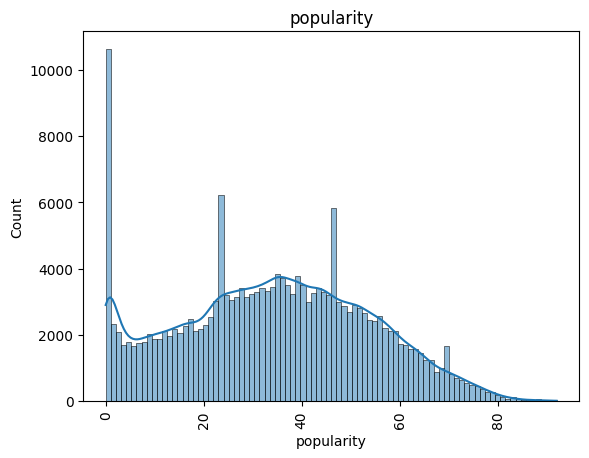

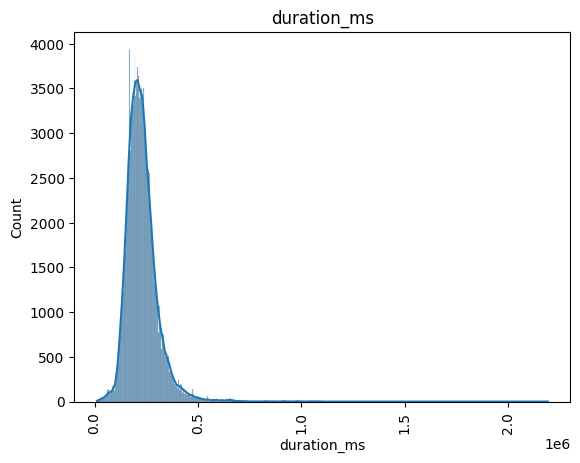

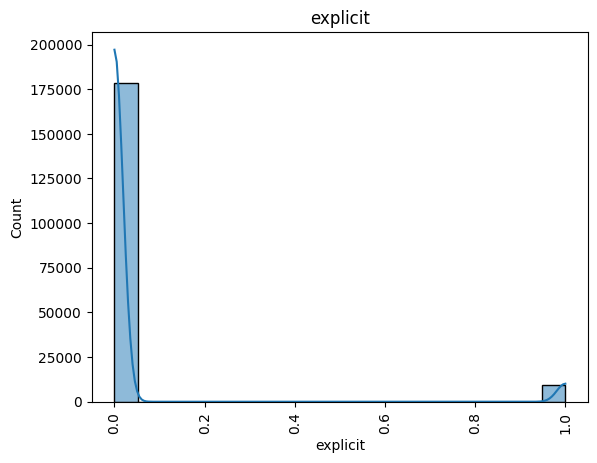

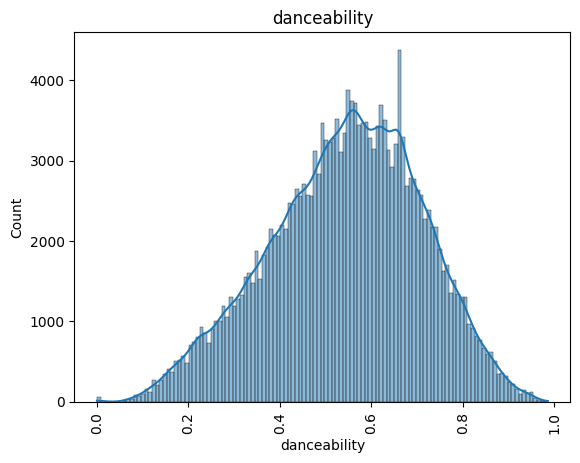

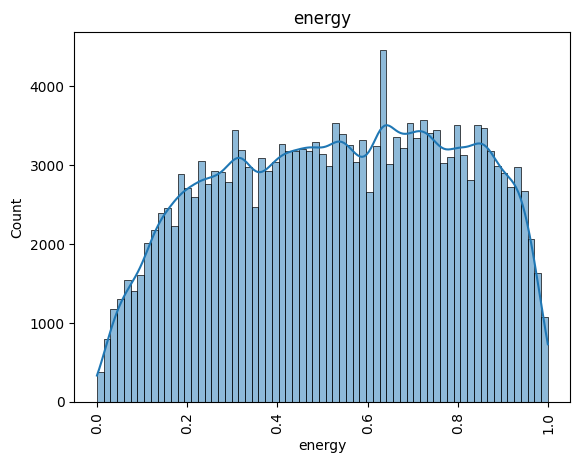

...

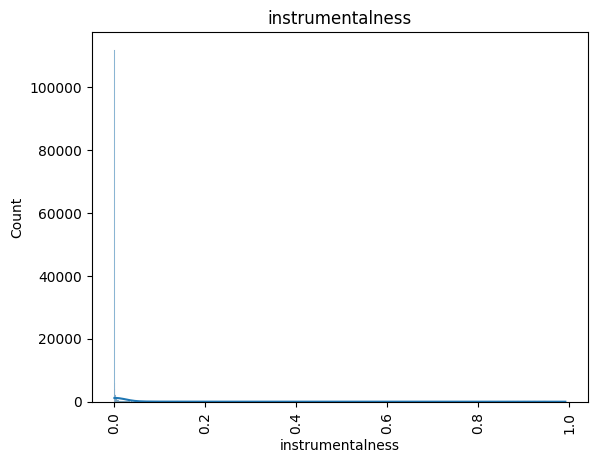

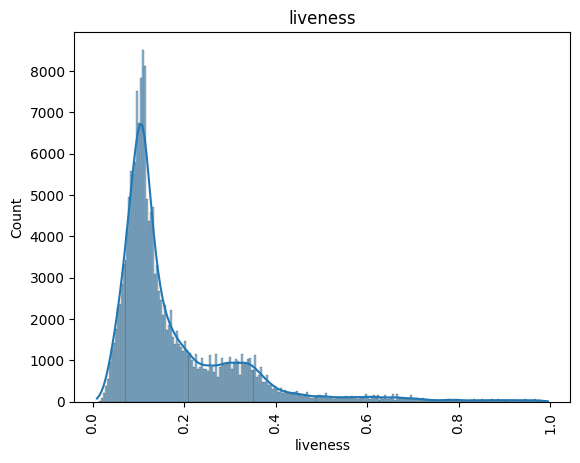

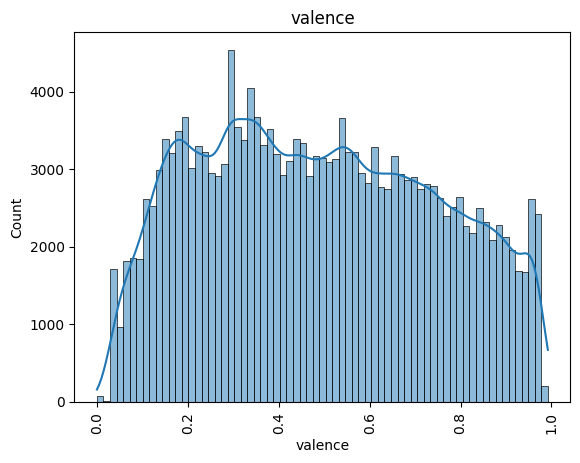

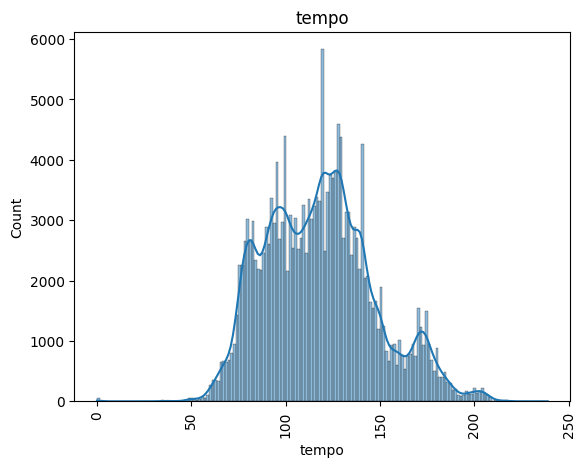

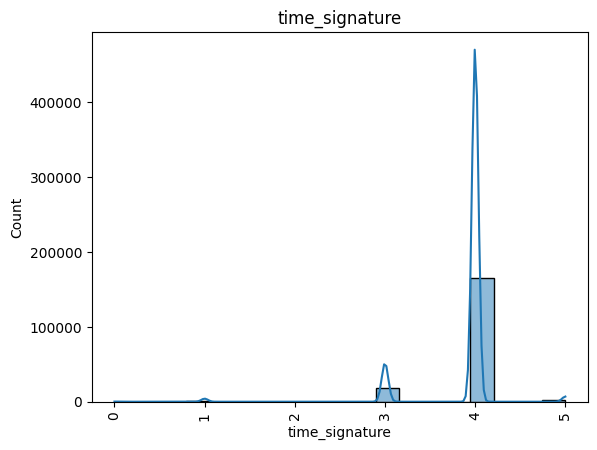

In [9]:
for column in song_data.columns:
    if song_data[column].dtype in ['int64', 'float64']:
        sns.histplot(data = song_data[column], kde=True, multiple='stack')
        plt.xticks(rotation=90)
        plt.title(column)
        plt.savefig(f"histograms/{column}_histogram.png")
        plt.show()

### Top 10 Songs in Various Parameters

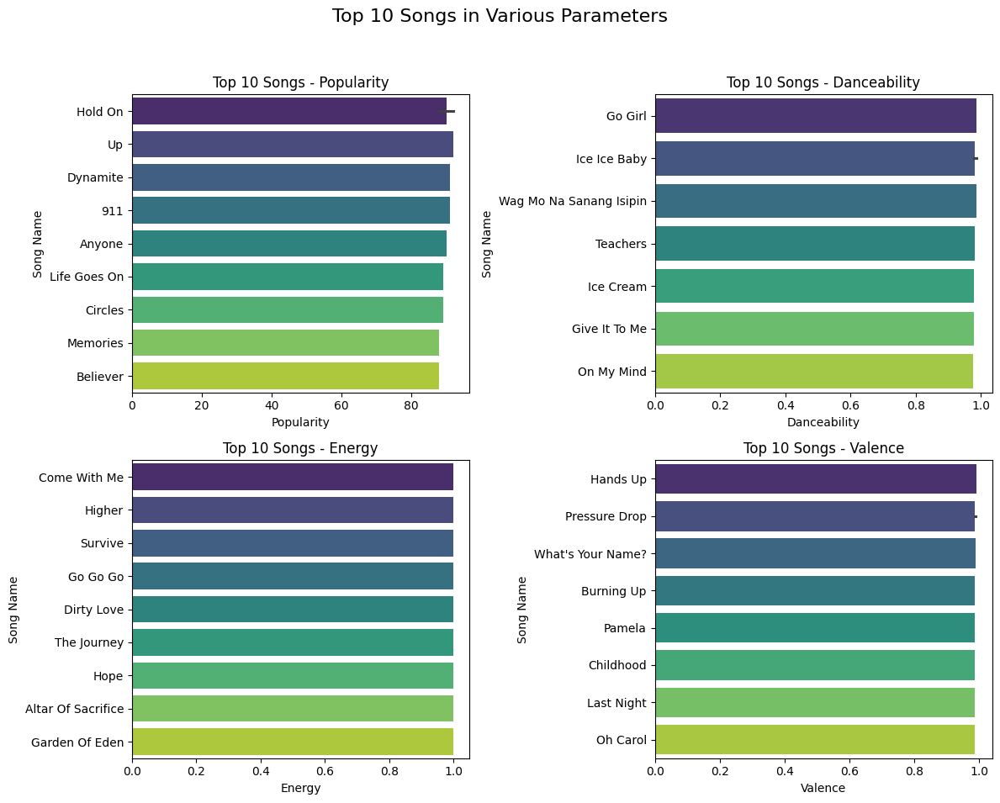

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'id' is the unique identifier for each song
song_data = song_data.drop_duplicates(subset='id', keep='first')

# Define the parameters for which you want to plot the top 10 songs
parameters = ['popularity', 'danceability', 'energy', 'valence']

# Create a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
fig.suptitle('Top 10 Songs in Various Parameters', fontsize=16)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Plot top 10 songs for each parameter
for i, parameter in enumerate(parameters):
    top10_songs = song_data.nlargest(10, parameter)
    sns.barplot(x=parameter, y='name', data=top10_songs, ax=axes[i], palette='viridis')
    axes[i].set_title(f'Top 10 Songs - {parameter.capitalize()}')
    axes[i].set_xlabel(parameter.capitalize())
    axes[i].set_ylabel('Song Name')

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(f"histograms/{column}_barplots.png")

plt.show()

### Pairplots for Various features

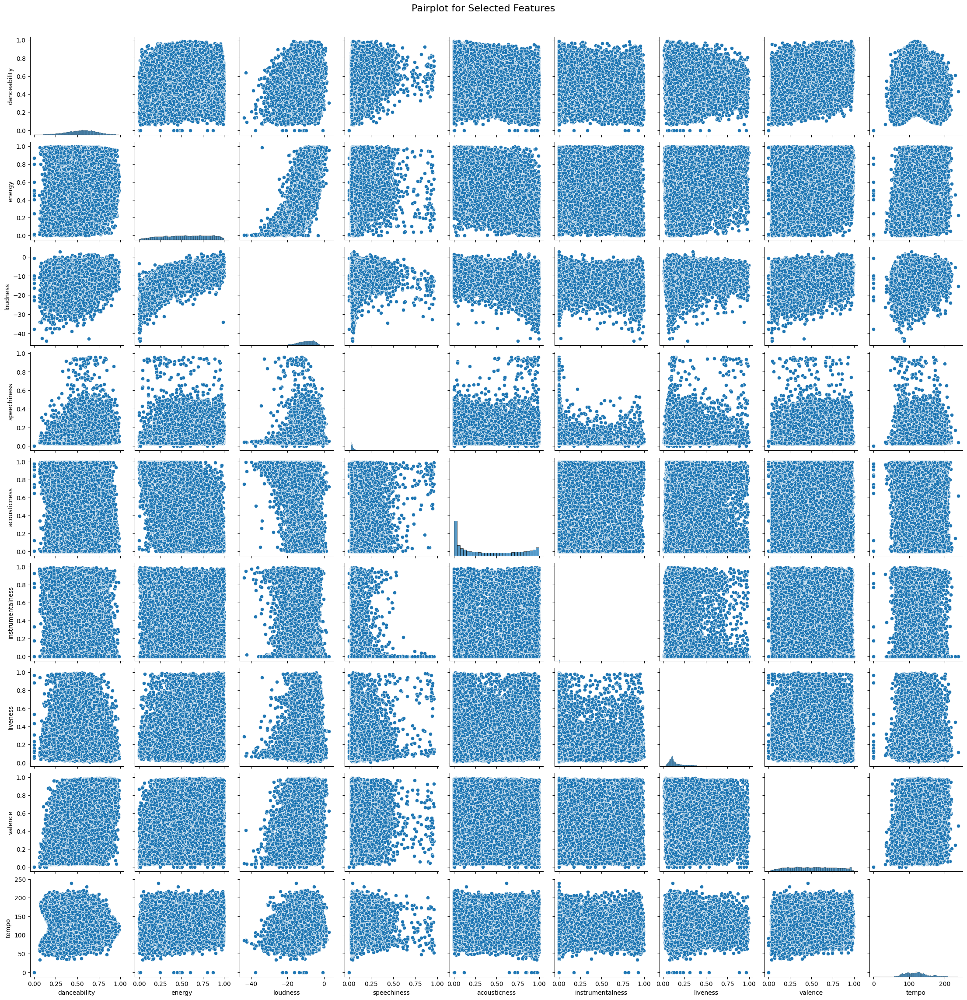

In [11]:
selected_features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
sns.pairplot(song_data[selected_features])
plt.suptitle('Pairplot for Selected Features', y=1.02, fontsize=16)
plt.savefig(f"histograms/{column}_pairplots.png")
plt.show()

### Correlation Heatmap for Selected Features

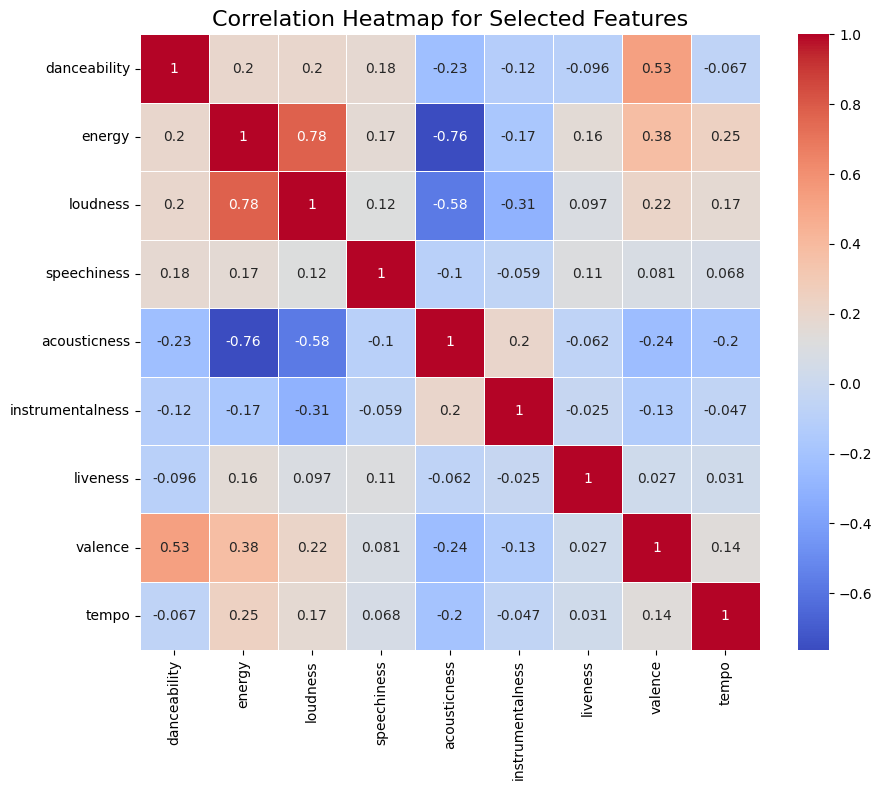

In [12]:
selected_features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
corr_matrix_selected = song_data[selected_features].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_selected, cmap="coolwarm", annot=True, linewidths=0.5)
plt.title("Correlation Heatmap for Selected Features", fontsize=16)
plt.savefig(f"histograms/{column}_heatmap.png")
plt.show()

### Boxplot for Selected Features

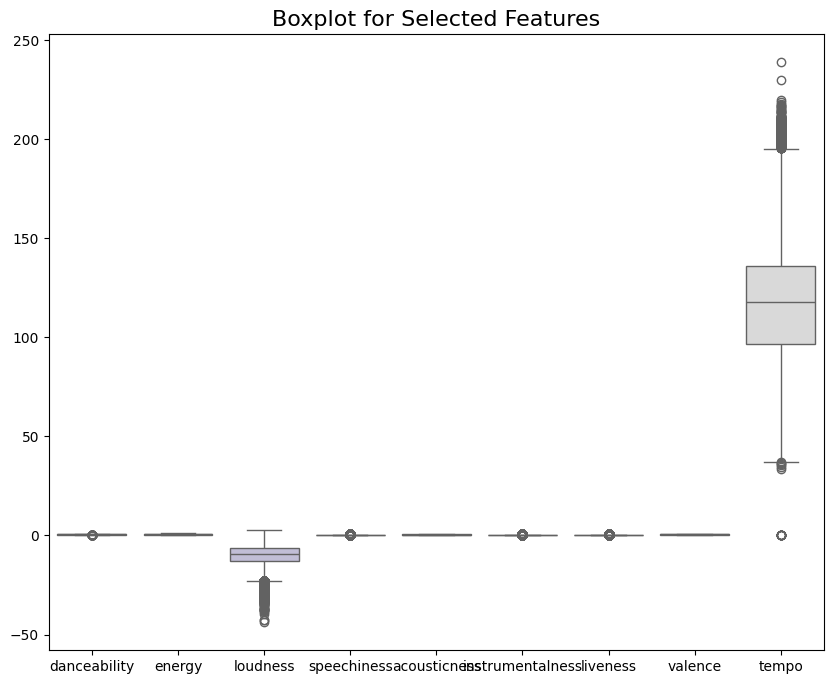

In [19]:
plt.figure(figsize=(10, 8))
sns.boxplot(data=song_data[selected_features], palette='Set3')
plt.title('Boxplot for Selected Features', fontsize=16)
plt.savefig(f"histograms/boxplots.png")
plt.show()

### Distribution of Songs by Mode (Major/Minor)

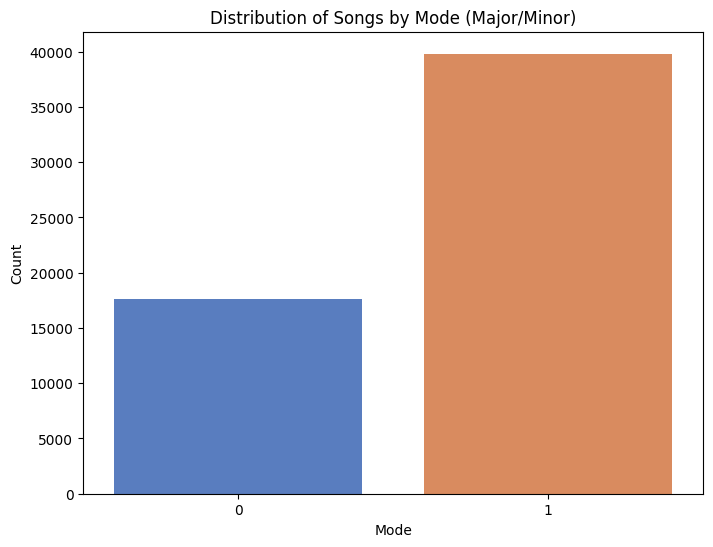

In [20]:
plt.figure(figsize=(8, 6))
sns.countplot(x='mode', data=song_data, palette='muted')
plt.title('Distribution of Songs by Mode (Major/Minor)')
plt.xlabel('Mode')
plt.ylabel('Count')
plt.savefig(f"histograms/mode.png")
plt.show()

### Top N Artists with Most Songs

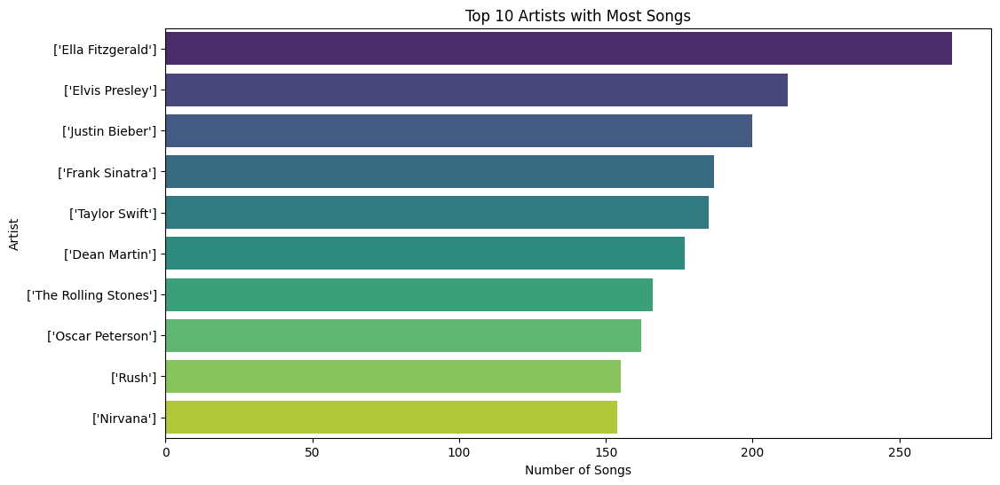

In [21]:
top_artists = song_data['artists'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_artists.values, y=top_artists.index, palette='viridis')
plt.title('Top 10 Artists with Most Songs')
plt.xlabel('Number of Songs')
plt.ylabel('Artist')
plt.savefig(f"histograms/artists.png")
plt.show()

### Word Cloud for Song artists

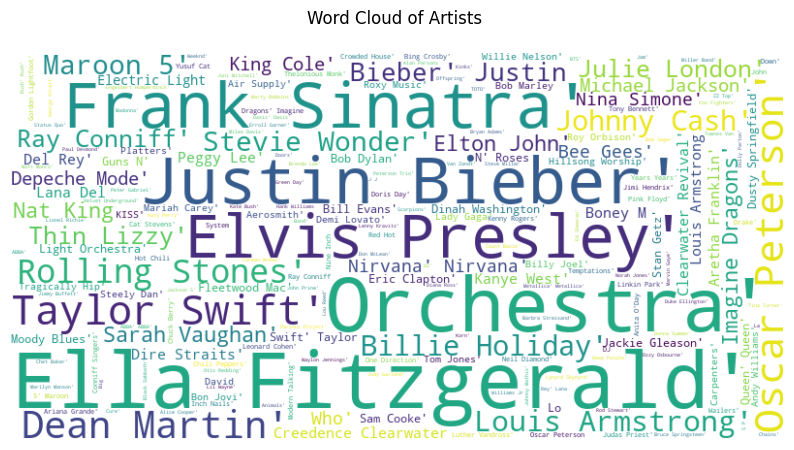

In [22]:
artists_text = ' '.join(song_data['artists'])
wordcloud_unique = WordCloud(width=800, height=400, background_color='white').generate(artists_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_unique, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Artists \n')
plt.savefig(f"histograms/artistfff.png")

plt.show()

### Top N Songs with Most Occurrences

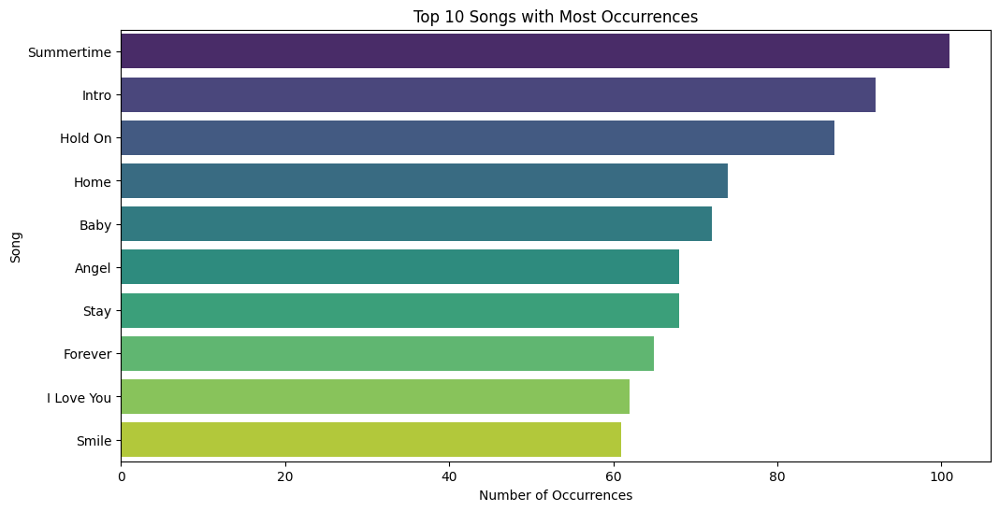

In [23]:
top_songs = song_data['name'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_songs.values, y=top_songs.index, palette='viridis')
plt.title('Top 10 Songs with Most Occurrences')
plt.xlabel('Number of Occurrences')
plt.ylabel('Song')
plt.savefig(f"histograms/occur.png")

plt.show()

### Popularity Distribution 

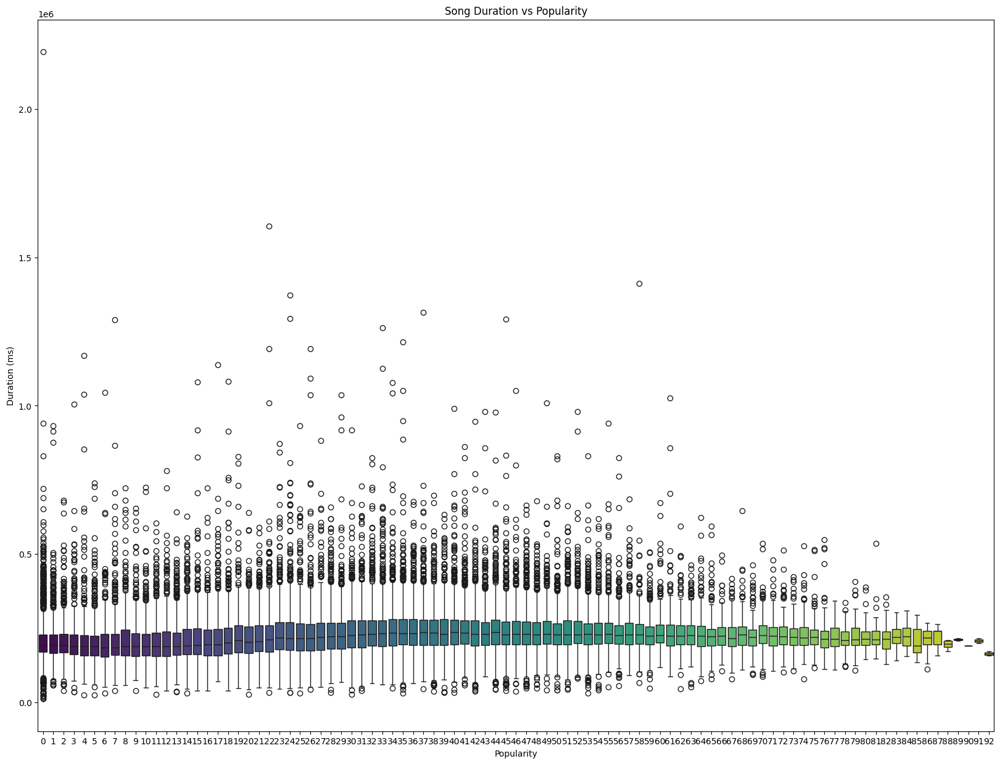

In [18]:
plt.figure(figsize=(20, 15))
sns.boxplot(x='popularity', y='duration_ms', data=song_data, palette='viridis')
plt.title('Song Duration vs Popularity')
plt.xlabel('Popularity')
plt.ylabel('Duration (ms)')
plt.savefig(f"histograms/{column}_boxplots.png")

plt.show()

### Word Cloud for Song Lyrics (using a library like wordcloud)

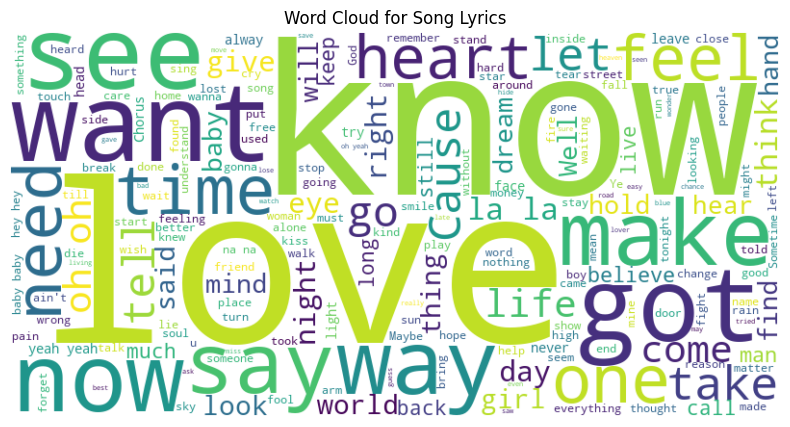

In [24]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(song_data['text']))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Song Lyrics')
plt.savefig(f"histograms/lyrics.png")

plt.show()

## Downsizing your dataset 

In [4]:
sample_size = 5000
song_data = song_data.sample(n=sample_size, random_state=42)
song_data = song_data.reset_index(drop=True)
pickle.dump(song_data,open('song_data.pkl','wb'))
song_data

,id,name,popularity,duration_ms,explicit,artists,release_date,danceability,energy,key,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,link,text
0,1v9EovC0CD8tKq88ZEI3Ri,Everything,46,240973,0,['ARASHI'],2009-07-01,0.645,0.892,1,...,1,0.0396,0.413000,0.000000,0.1160,0.922,121.015,4,/y/young+jeezy/everything_20757378.html,Whats up? you got a man?! what the fuck is tha...
1,77QLO6fafn5BGev2ADuFKz,Ooh La La,44,256021,0,"['Bappi Lahiri', 'Shreya Ghoshal']",2011-10-29,0.742,0.972,6,...,1,0.1500,0.102000,0.000033,0.0563,0.766,126.049,4,/b/britney+spears/ooh+la+la_21061266.html,You don't have to look like a movie star \nOo...
2,7iEVmnzJr1V7duYKPWplzp,Bringin' On The Heartbreak,59,273733,0,['Def Leppard'],1981-07-11,0.329,0.676,9,...,0,0.0324,0.036600,0.000000,0.1800,0.529,78.217,4,/d/def+leppard/bringin+on+the+heartbreak_20038...,"Gypsy, sittin' lookin' pretty \nThe broken ro..."
3,52am0fzNdEwaQoRKoxMmfY,Have Yourself A Merry Little Christmas,3,166907,0,['Tex Beneke And His Orchestra'],1936,0.192,0.152,8,...,1,0.0302,0.873000,0.000017,0.1060,0.165,83.425,3,/d/demi+lovato/have+yourself+a+merry+little+ch...,"Oh yeah, mmm \nHave yourself a merry little C..."
4,53cfelfzTz55wERUGEuZ0q,This Is The Life,55,185973,0,['Amy Macdonald'],2007,0.516,0.898,1,...,0,0.0452,0.240000,0.000000,0.0647,0.817,190.068,4,/w/weird+al+yankovic/this+is+the+life_20145870...,I eat filet mignon seven times a day \nMy bat...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,5R1g0HPX7Di73yxCxiRQJE,Ain't No Sunshine,28,515267,0,"['Grover Washington, Jr.']",1972-01-01,0.415,0.371,9,...,0,0.0351,0.791000,0.203000,0.0952,0.556,147.362,4,/m/michael+bolton/aint+no+sunshine_20092509.html,Ain't no sunshine when she's gone \nIt's not ...
4996,0H7vtEjDMbjdPBaVsnvk2l,Friday,42,253293,0,['J.J. Cale'],1979-08,0.602,0.570,0,...,1,0.0515,0.578000,0.002660,0.1240,0.899,201.808,4,/r/rascal+flatts/friday_21061649.html,"Alarm clock, ding-dong, pants up, boots on \n..."
4997,6A9PpxwWPHaR6DlKi25Won,Sway,43,139427,0,['Ben E. King'],1961,0.566,0.543,4,...,0,0.0353,0.775000,0.002790,0.2040,0.744,120.900,4,/o/ocean+colour+scene/sway_20102539.html,I want to say yes to what you say \nIf there'...
4998,6MeQRL7mOCQBrb9xQW8RGF,Beautiful,47,259600,0,['Creed'],1999-01-01,0.438,0.850,3,...,1,0.0395,0.000024,0.000630,0.1310,0.315,144.610,4,/k/kylie+minogue/beautiful_21079329.html,"You, you are so beautiful \n \nIt used to be..."


## Recommendation System using Similarity of lyrics

### Formatting the text song_data

In [39]:
# Converting text to lowercase
song_data['text'] = song_data['text'].str.lower()

# Removing non-alphanumeric characters (excluding spaces and underscores)
song_data['text'] = song_data['text'].str.replace(r'[^\w\s]', '')

# Removing punctuation
song_data['text'] = song_data['text'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)))

# Replacing newline characters with spaces
song_data['text'] = song_data['text'].str.replace(r'\n', ' ', regex=True)

# Displaying the modified song_dataFrame
song_data['text'][0]

'whats up you got a man what the fuck is that   you dont know who i is oh yeah   well he aint got shit on me      chorus x4   ya nigga aint seeing me   i put that on everything   put that on everything   put that on everything      young jeezy   im going out the same way i came in hard then a motherfucker   real street nigga i aint nothing like these other suckersna   how much the club cost i mite by this motherfucker   have the feds park right outside this motherfucker   you know the name bitch   hotter than fish grease grease   got a hundred move hundred that was this week damn   she wont me to get the room man this bitch cheap what   but she roll the weed good and she a big freak yea   we on 75 her hands down my 87s 7z   dolce gabbana belt check   you know the mack11 yea   first name got gots   last name ends ends   fix your mouth   fix your face   you mite get a benz      chorus x2      boosie   put that on momma my daddy everything i love   for everything i rap   my gangstas in th

### Combine 'artist' and 'text' columns and assign the result to 'tags'


In [40]:
song_data['tags'] = song_data['name'] + ' '+ song_data['text']
song_data

,id,name,popularity,duration_ms,explicit,artists,release_date,danceability,energy,key,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,link,text,tags
0,1v9EovC0CD8tKq88ZEI3Ri,Everything,46,240973,0,['ARASHI'],2009-07-01,0.645,0.892,1,...,0.0396,0.413000,0.000000,0.1160,0.922,121.015,4,/y/young+jeezy/everything_20757378.html,whats up you got a man what the fuck is that ...,Everything whats up you got a man what the fuc...
1,77QLO6fafn5BGev2ADuFKz,Ooh La La,44,256021,0,"['Bappi Lahiri', 'Shreya Ghoshal']",2011-10-29,0.742,0.972,6,...,0.1500,0.102000,0.000033,0.0563,0.766,126.049,4,/b/britney+spears/ooh+la+la_21061266.html,you dont have to look like a movie star ooh ...,Ooh La La you dont have to look like a movie s...
2,7iEVmnzJr1V7duYKPWplzp,Bringin' On The Heartbreak,59,273733,0,['Def Leppard'],1981-07-11,0.329,0.676,9,...,0.0324,0.036600,0.000000,0.1800,0.529,78.217,4,/d/def+leppard/bringin+on+the+heartbreak_20038...,gypsy sittin lookin pretty the broken rose w...,Bringin' On The Heartbreak gypsy sittin lookin...
3,52am0fzNdEwaQoRKoxMmfY,Have Yourself A Merry Little Christmas,3,166907,0,['Tex Beneke And His Orchestra'],1936,0.192,0.152,8,...,0.0302,0.873000,0.000017,0.1060,0.165,83.425,3,/d/demi+lovato/have+yourself+a+merry+little+ch...,oh yeah mmm have yourself a merry little chr...,Have Yourself A Merry Little Christmas oh yeah...
4,53cfelfzTz55wERUGEuZ0q,This Is The Life,55,185973,0,['Amy Macdonald'],2007,0.516,0.898,1,...,0.0452,0.240000,0.000000,0.0647,0.817,190.068,4,/w/weird+al+yankovic/this+is+the+life_20145870...,i eat filet mignon seven times a day my bath...,This Is The Life i eat filet mignon seven time...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,5R1g0HPX7Di73yxCxiRQJE,Ain't No Sunshine,28,515267,0,"['Grover Washington, Jr.']",1972-01-01,0.415,0.371,9,...,0.0351,0.791000,0.203000,0.0952,0.556,147.362,4,/m/michael+bolton/aint+no+sunshine_20092509.html,aint no sunshine when shes gone its not warm...,Ain't No Sunshine aint no sunshine when shes g...
4996,0H7vtEjDMbjdPBaVsnvk2l,Friday,42,253293,0,['J.J. Cale'],1979-08,0.602,0.570,0,...,0.0515,0.578000,0.002660,0.1240,0.899,201.808,4,/r/rascal+flatts/friday_21061649.html,alarm clock dingdong pants up boots on coffe...,Friday alarm clock dingdong pants up boots on ...
4997,6A9PpxwWPHaR6DlKi25Won,Sway,43,139427,0,['Ben E. King'],1961,0.566,0.543,4,...,0.0353,0.775000,0.002790,0.2040,0.744,120.900,4,/o/ocean+colour+scene/sway_20102539.html,i want to say yes to what you say if theres ...,Sway i want to say yes to what you say if th...
4998,6MeQRL7mOCQBrb9xQW8RGF,Beautiful,47,259600,0,['Creed'],1999-01-01,0.438,0.850,3,...,0.0395,0.000024,0.000630,0.1310,0.315,144.610,4,/k/kylie+minogue/beautiful_21079329.html,you you are so beautiful it used to be yo...,Beautiful you you are so beautiful it use...


### Define different types of word_tokenizers

In [41]:
# Creating a PorterStemmer instance
stemmer = PorterStemmer()
'''
This function takes a text input (txt), tokenizes it into words, and then applies stemming to each word using the PorterStemmer.
Finally, it joins the stemmed words back into a string.
'''
def tokenization_with_stemmer(txt):
    tokens = nltk.word_tokenize(txt)
    stemming = [stemmer.stem(w) for w in tokens]
    return " ".join(stemming)


# Creating a WordNetLemmatizer instance
lemmatizer = WordNetLemmatizer()
'''
This function takes a text input (txt), tokenizes it into words,
and then applies lemmatization to each word using the WordNetLemmatizer.
Finally, it joins the lemmatized words back into a string.
'''
def tokenization_with_lemmatizer(txt):
    tokens = nltk.word_tokenize(txt)
    lemmatized = [lemmatizer.lemmatize(w) for w in tokens]
    return " ".join(lemmatized)

# Set of common English stop words
stop_words = set(stopwords.words('english'))
'''
This function tokenizes the input text and removes common stop words.
It then joins the remaining words back into a string.
'''
def remove_stop_words(txt):
    tokens = nltk.word_tokenize(txt)
    filtered_tokens = [word for word in tokens if word not in stop_words]
    return " ".join(filtered_tokens)

### Applying the tokenizers

In [42]:
song_data['tags'] = song_data['tags'].apply(tokenization_with_lemmatizer)
song_data['tags'] = song_data['tags'].apply(tokenization_with_stemmer)
song_data['tags'] = song_data['tags'].apply(remove_stop_words)
song_data['tags'][0]

'everyth got man fuck dont know oh yeah well aint got shit choru x4 ya nigga aint see put everyth put everyth put everyth young jeezi im go way came hard motherfuck real street nigga aint noth like suckersna much club cost mite thi motherfuck fed park right outsid thi motherfuck know name bitch hotter fish greas greas got hundr move hundr wa thi week damn wont get room man thi bitch cheap roll weed good big freak yea 75 hand 87 7z dolc gabbana belt check know mack11 yea first name got got last name end end fix mouth fix face mite get benz choru x2 boosi put momma daddi everyth love everyth rap gangsta trap cant see magnifi glass 200 dash tri game bust ya nigga whole click iphon nigga get shine use whip zip microphon man aliv cant stop shine hustl man want bad caus bad came noth man shine em grind em bout im talk bout show bitch hous gone take dick floss show show im get dough 100 g time im j round way louisiana mine nigga choru x4 dont befor man hi busi draw line right famili never cro

### Applying Natural Language Processing (NLP) Algos

***Term Frequency (TF):*** It measures how frequently a term (word) occurs in a document. TF is calculated as the ratio of the number of times a term appears in a document to the total number of terms in the document.

***Inverse Document Frequency (IDF):*** It measures how important a term is across multiple documents. IDF is calculated as the logarithm of the ratio of the total number of documents to the number of documents containing the term.

***TF-IDF:*** The product of TF and IDF, it quantifies the importance of a term in the context of a specific document and the entire corpus. Words with high TF-IDF scores are often important in representing the content of a document.

In [43]:
tfidf_vectorizer = TfidfVectorizer(analyzer='word',stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(song_data['text'])
# Use the sparse matrix directly without converting to dense
sparse_tfidf_matrix = csr_matrix(tfidf_matrix)

In [44]:
sparse_tfidf_matrix[0]

<1x18987 sparse matrix of type '<class 'numpy.float64'>'
	with 134 stored elements in Compressed Sparse Row format>

### Calculate similarity scores

In [46]:
lyrics_similarity = cosine_similarity(sparse_tfidf_matrix)
pickle.dump(lyrics_similarity,open('lyrics_similarity.pkl','wb'))

In [47]:
lyrics_similarity[0]

array([1.        , 0.04285351, 0.01145113, ..., 0.01983948, 0.0476263 ,
       0.1049605 ])

In [48]:
def get_recommendations(song_title, cosine_sim=lyrics_similarity):
    idx = song_data[song_data['name'] == song_title].index[0]
    sim_scores = sorted(enumerate(cosine_sim[idx]), key=lambda x: x[1], reverse=True)
    
    # Filter out songs with the same name as the input song
    sim_scores = [(i, score) for i, score in sim_scores if song_data['name'].iloc[i] != song_title]
    
    # Getting the top 10 most similar songs
    sim_scores = sim_scores[:10]
    
    # Get the indices and names of the recommended songs
    song_indices = [i[0] for i in sim_scores]
    recommended_songs = list(set(song_data['name'].iloc[song_indices]))
    
    # Prepare data for tabulate
    table_data = [(song, f"{score:.2%}") for song, score in zip(recommended_songs, [i[1] for i in sim_scores])]
    
    # Print the table
    print("\nRecommended Songs:")
    print(tabulate(table_data, headers=["Song", "Similarity Score"], tablefmt="pretty"))

    # Return only the names
    return recommended_songs

### Example usage

In [51]:
get_recommendations("Friday")


Recommended Songs:
+------------------+------------------+
|       Song       | Similarity Score |
+------------------+------------------+
|  I Stay In Love  |      28.76%      |
|     La La La     |      28.76%      |
|     Frantic      |      28.58%      |
| I Believe In You |      28.55%      |
|   Love Machine   |      28.17%      |
| This Is Our Song |      27.28%      |
|   Rotten Apple   |      25.58%      |
|  Birthday Song   |      25.31%      |
|     So What      |      21.53%      |
+------------------+------------------+


['I Stay In Love',
 'La La La',
 'Frantic',
 'I Believe In You',
 'Love Machine',
 'This Is Our Song',
 'Rotten Apple',
 'Birthday Song',
 'So What']

## Recommendation System using Musical Features through cosine similarity

### Select relevant musical features

In [52]:
features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

### Convert the features to a single string for each track

In [53]:
song_data['features_str'] = song_data[features].astype(str).agg(' '.join, axis=1)

### Applying Natural Language Processing (NLP) Algos

In [54]:
# Create a TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english')
# Fit and transform the data
tfidf_matrix = tfidf_vectorizer.fit_transform(song_data['features_str'])
sparse_tfidf_matrix = csr_matrix(tfidf_matrix)

### Calculate cosine similarity

In [55]:
cosine_sim = cosine_similarity(sparse_tfidf_matrix, sparse_tfidf_matrix)
musical_feature_similarity = cosine_similarity(sparse_tfidf_matrix)
pickle.dump(musical_feature_similarity,open('musical_feature_similarity.pkl','wb'))

In [56]:
def get_recommendations(song_title, cosine_sim=musical_feature_similarity):
    idx = song_data[song_data['name'] == song_title].index[0]
    sim_scores = sorted(enumerate(cosine_sim[idx]), key=lambda x: x[1], reverse=True)
    
    # Filter out songs with the same name as the input song
    sim_scores = [(i, score) for i, score in sim_scores if song_data['name'].iloc[i] != song_title]
    
    # Getting the top 10 most similar songs
    sim_scores = sim_scores[:10]
    
    # Get the indices and names of the recommended songs
    song_indices = [i[0] for i in sim_scores]
    recommended_songs = list(set(song_data['name'].iloc[song_indices]))
    
    # Prepare data for tabulate
    table_data = [(song, f"{score:.2%}") for song, score in zip(recommended_songs, [i[1] for i in sim_scores])]
    
    # Print the table
    print("\nRecommended Songs:")
    print(tabulate(table_data, headers=["Song", "Similarity Score"], tablefmt="pretty"))

    # Return only the names
    return recommended_songs

In [59]:
get_recommendations("Friday")


Recommended Songs:
+-----------------+------------------+
|      Song       | Similarity Score |
+-----------------+------------------+
|  Computer Blue  |      24.21%      |
|      Solo       |      21.61%      |
|      Lies       |      18.89%      |
|  Forever Young  |      17.68%      |
|     Heaven      |      16.94%      |
|     Hold Me     |      16.62%      |
| I Want You Back |      16.47%      |
|     No Love     |      16.44%      |
|   Photograph    |      15.26%      |
+-----------------+------------------+


['Computer Blue',
 'Solo',
 'Lies',
 'Forever Young',
 'Heaven',
 'Hold Me',
 'I Want You Back',
 'No Love',
 'Photograph']

## Recommendation System using Musical Features through Alternating Least Squares

### *Alternating Least Squares* : 
It is a collaborative filtering algorithm used for matrix factorization. Collaborative filtering is a technique that makes automatic predictions (filtering) about the preferences of a user by collecting preferences from many users (collaborating).

### Select relevant features for recommendation

In [146]:
features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

### Creating a feature matrix

In [147]:
user_item_matrix = csr_matrix(song_data[features].values)
user_item_matrix

<5000x9 sparse matrix of type '<class 'numpy.float64'>'
	with 43543 stored elements in Compressed Sparse Row format>

### Creating an ALS model and fitting it to data

In [148]:
# Create an ALS model
model = AlternatingLeastSquares(factors=50, regularization=0.01, iterations=100)

# Fit the model to the feature matrix
model.fit(user_item_matrix)

# Save the best model to a file using pickle
with open('als_model.pkl', 'wb') as file:
    pickle.dump(model, file)

100%|█████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:16<00:00,  6.12it/s]


### Load the best model from the file

In [149]:
with open('als_model.pkl', 'rb') as file:
    loaded_best_model = pickle.load(file)

In [150]:
loaded_best_model

In [151]:
user_factors = loaded_best_model.user_factors
item_factors = loaded_best_model.item_factors

# Print the shape of user and item factors matrices
print("User Factors Shape:", user_factors.shape)
print("Item Factors Shape:", item_factors.shape)

User Factors Shape: (5000, 50)
Item Factors Shape: (9, 50)


In [152]:
def get_recommendations(track_name, model, song_data, num_recommendations=100000):
    track_index = song_data[song_data['name'] == track_name].index[0]
    user_vector = model.user_factors[track_index]

    # Calculate the dot product between the user vector and item factors
    scores = user_vector.dot(model.item_factors.T)

    # Get track indices with highest scores
    recommended_track_indices = scores.argsort()[-num_recommendations * 2:][::-1]

    # Filter out redundant and same-name tracks
    recommendations = []
    seen_names = set()
    for idx in recommended_track_indices:
        if len(recommendations) >= num_recommendations:
            break
        recommended_track_name = song_data.loc[idx, 'name']
        if recommended_track_name not in seen_names and recommended_track_name != track_name:
            recommendations.append(recommended_track_name)
            seen_names.add(recommended_track_name)

    return recommendations[:num_recommendations][::-1]

In [153]:
# Example usage:
track_name = "Friday"
recommendations = get_recommendations(track_name, loaded_best_model, song_data)
print("Recommendations for Track:", track_name)
print(recommendations)

Recommendations for Track: Friday
["Bringin' On The Heartbreak", "In Harm's Way", 'This Is The Life', 'Ooh La La', 'Love', 'Solo', 'Stay', 'Everything', 'Have Yourself A Merry Little Christmas']


## Recommendation System using similarity of Collabrative Features or User-interaction Features

In [155]:
def recommend_song(song_data, user_song_name):
    # Sort song_data by popularity, time_signature, and other relevant features
    sorted_song_data = song_data.sort_values(by=['popularity', 'time_signature', 'duration_ms', 'explicit'], ascending=[False, True, True, False])

    # Filter song_data similar to the user's song
    user_song = song_data[song_data['name'].str.lower() == user_song_name.lower()]

    if user_song.empty:
        return ["Sorry, the provided song name is not in the dataset."]

    user_song_signature = user_song['time_signature'].values[0]
    user_song_duration = user_song['duration_ms'].values[0]
    user_song_explicit = user_song['explicit'].values[0]

    # Filter song_data with similar time_signature, higher popularity, similar duration, and opposite explicit value
    recommended_songs = sorted_song_data[
        (sorted_song_data['time_signature'] == user_song_signature) &
        (sorted_song_data['popularity'] > user_song['popularity'].values[0]) &
        (abs(sorted_song_data['duration_ms'] - user_song_duration) < sorted_song_data['duration_ms'].median()) &  
        (sorted_song_data['explicit'] != user_song_explicit)
    ]

    # Exclude redundant and same-name songs
    recommended_songs = recommended_songs[recommended_songs['name'].str.lower() != user_song_name.lower()]
    if not recommended_songs.empty:
        unique_recommended_song_names = set(recommended_songs['name'].head(1000).tolist())
        return list(unique_recommended_song_names)[:10]
    else:
        return ["Sorry, no similar songs found with higher popularity."]

### Example usage:

In [156]:
user_input_song = "Beautiful"
recommendations = recommend_song(song_data, user_input_song)
print(recommendations)

['You', 'Smile', 'Fake Love', 'Lost', 'Jungle', 'Ghost', 'King For A Day', 'Power', 'Happy Song', 'Love Me']


## Recommendation System using similarity of artists through Graph

### Creating a graph where artists are nodes and edges connect similar artists

In [184]:
G = nx.Graph()

for artists in song_data['artists']:
    for i in range(len(artists)):
        for j in range(i + 1, len(artists)):
            if G.has_edge(artists[i], artists[j]):
                G[artists[i]][artists[j]]['weight'] += 1
            else:
                G.add_edge(artists[i], artists[j], weight=1)

### Save Graph G to a File using Pickle

In [185]:
with open("graph_data.pkl", "wb") as file:
    pickle.dump(G, file)

### Load Graph G from File using Pickle

In [5]:
with open("graph_data.pkl", "rb") as file:
    G = pickle.load(file)

### Visualize Graph G 

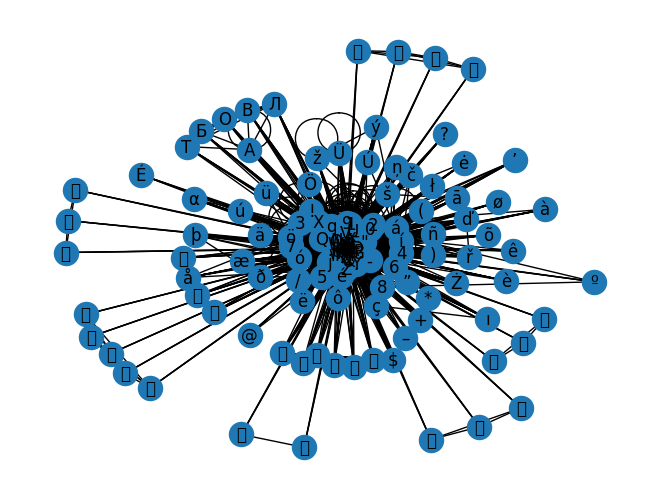

In [8]:
nx.draw(G,with_labels = True)
# Save the figure
plt.savefig("artist_collaboration_network.png")

# Show the plot (optional)
plt.show()

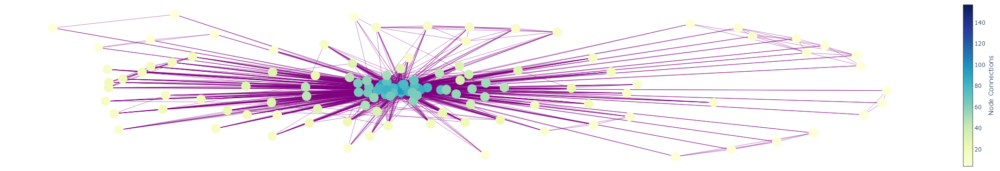

In [7]:
# Extract node positions using a layout algorithm
pos = nx.spring_layout(G)

# Create a plotly graph object
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='purple'),  # Purple color for edges
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=20,
        colorbar=dict(
            thickness=20,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        color='red'  # Red color for nodes
    )
)

# Customize node hover text
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append('# of connections: ' + str(len(adjacencies[1])))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

# Create a figure and add traces
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0, l=0, r=0, t=0),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    plot_bgcolor='white'  # Set background color to white
                )
            )

# Show the figure
fig.show()

### Function to recommend songs based on input song name

In [199]:
def recommend_songs(input_song_name, graph, num_recommendations=20):
    # Find the artist(s) for the input song
    input_song_artist = song_data[song_data['name'] == input_song_name]['artists'].iloc[0]

    # Find similar artists based on the network
    similar_artists = []
    for artist in input_song_artist:
        similar_artists.extend([neighbor for neighbor, _ in graph[artist].items()])

    # Remove input song artist(s) from the list
    similar_artists = list(set(similar_artists) - set(input_song_artist))

    # Get songs by similar artists
    recommendations = song_data[song_data['artists'].apply(lambda x: any(artist in x for artist in similar_artists))]

    # Exclude input song from recommendations
    recommendations = recommendations[recommendations['name'] != input_song_name]

    # Sort by popularity and select top recommendations
    recommendations = recommendations.sort_values(by='popularity', ascending=False).head(num_recommendations)

    # Use set to uniquify the list of song names
    unique_recommendations = set(recommendations['name'])

    # Convert set to list before returning
    return list(unique_recommendations)

### Example usage

In [200]:
input_song_name = "Beautiful"
recommendations = recommend_songs(input_song_name,G)
recommendations

['One More Time',
 'Numb',
 'Stay',
 'Bruises',
 'Hold On',
 'Stronger',
 'Gone',
 'Waiting For Love',
 'Trust',
 'Wake Me Up Before You Go-Go',
 'Memories',
 'The Scientist',
 'Photograph',
 'Best Friend',
 'Someone Like You']